imports

In [1]:
import matplotlib.pyplot as plt
import torch
import sys
import os
from sklearn.metrics import f1_score
from tqdm.notebook import tqdm as tqdm
from tqdm.auto import trange

import warnings
warnings.filterwarnings("ignore")

from myhelpers import config_plots, TrialStatistics
from HGNN.train import CNN, dataLoader
from HGNN.train.configParser import ConfigParser, getModelName, getDatasetName
config_plots.global_settings()

parameters

In [2]:
experimentsPath="/home/elhamod/HGNN/experiments/"
dataPath="/data/BGNN_data"
experimentName="learningRateTest"

cuda=0

Cuda

In [3]:
# set cuda
if torch.cuda.is_available():
    torch.cuda.set_device(cuda)
    print("using cuda", cuda)

using cuda 0


Setup

In [4]:
config_parser = ConfigParser(experimentsPath, dataPath, experimentName)

experimentPathAndName = os.path.join(experimentsPath, experimentName)

# instantiate trial stat object
results_dir = os.path.join(experimentPathAndName, "results")
ts = TrialStatistics.TrialStatistics(results_dir)
ts_coarse = TrialStatistics.TrialStatistics(results_dir, "coarse")

datasetManager = dataLoader.datasetManager(experimentPathAndName)

paramsIterator = config_parser.getExperiments()  
number_of_experiments = sum(1 for e in paramsIterator)  

Show and save trial statistics

In [5]:
with tqdm(total=number_of_experiments, desc="experiment") as bar:
    for experiment_params in config_parser.getExperiments():
        
        datasetManager.updateParams(config_parser.fixPaths(experiment_params))
        dataset = datasetManager.getDataset()
        
        # For analyzing experiments, we don't care about augmentation
        dataset.toggle_image_loading(augmentation=False, normalization=dataset.normalization_enabled)
        
        train_loader, validation_loader, test_loader = datasetManager.getLoaders()
        fineList = dataset.csv_processor.getFineList()
        coarseList = dataset.csv_processor.getCoarseList()
        numberOffine = len(fineList)
        numberOfcoarse = len(coarseList)
        architecture = {
            "fine": numberOffine,
            "coarse" : numberOfcoarse
        }
        
        # Loop through n trials
        for i in trange(experiment_params["numOfTrials"], desc="trial"):
            modelName = getModelName(experiment_params, i)
            trialName = os.path.join(experimentPathAndName, modelName)
            
            # Train/Load model
            print(experiment_params)
            model = CNN.create_model(architecture, experiment_params)
            if os.path.exists(CNN.getModelFile(trialName)):
                df, epochs, time_elapsed = CNN.loadModel(model, trialName)
                
                # Update trial outcomes for statistics
                predlist, lbllist = CNN.getLoaderPredictions(test_loader, model, experiment_params)
                ts.addTrialPredictions(experiment_params, predlist, lbllist, numberOffine)
                micro_f1 = f1_score(lbllist.cpu(), predlist.cpu(), average='macro')

                predlist, lbllist = CNN.getLoaderPredictionProbabilities(test_loader, model, experiment_params)
                topk = CNN.top_k_acc(predlist, lbllist, topk=(3,5))

                predlist, lbllist = CNN.getLoaderPredictions(test_loader, model, experiment_params, 'coarse')
                ts_coarse.addTrialPredictions(experiment_params, predlist, lbllist, numberOfcoarse)
                micro_f1_coarse = f1_score(lbllist.cpu(), predlist.cpu(), average='macro')

                predlist, lbllist = CNN.getLoaderPredictions(validation_loader, model, experiment_params)
                macro_f1_val = f1_score(lbllist.cpu(), predlist.cpu(), average='macro')

                score = {'loss': CNN.getCrossEntropyFromLoader(test_loader, model, experiment_params),
                         'average correct guess prob': CNN.getAvgProbCorrectGuessFromLoader(test_loader, model, experiment_params),
                         'macro f1 test fine': micro_f1,
                         'macro f1 test coarse': micro_f1_coarse,
                         'macro f1 validation fine': macro_f1_val,
                         'time': time_elapsed,
                         'epochs': epochs,
                         'top-3': topk[0].cpu().numpy(),
                         'top-5': topk[1].cpu().numpy(),
                        }

                ts.addTrial(experiment_params,
                    score, i)
            else:
                print("Model {0} not found!".format(trialName))
        
        bar.update()
        
# Save experiment results
ts.saveStatistics()
ts.saveStatistics(False)
ts.showStatistics()
ts.showStatistics(False)

Creating dataset...


Loading images: 100%|██████████| 2600/2600 [03:21<00:00, 12.90it/s, fileName=INHS_FISH_63588.jpg]  

Creating dataset... Done.
Loading saved indices...
file /home/elhamod/HGNN/experiments/learningRateTest/datasplits/2788d2bc2c355b1c8cf2f3ac00958c413530a8f359f22067b2b8cfbc/trainingIndex.csv read
file /home/elhamod/HGNN/experiments/learningRateTest/datasplits/2788d2bc2c355b1c8cf2f3ac00958c413530a8f359f22067b2b8cfbc/valIndex.csv read
file /home/elhamod/HGNN/experiments/learningRateTest/datasplits/2788d2bc2c355b1c8cf2f3ac00958c413530a8f359f22067b2b8cfbc/testIndex.csv read
Creating loaders...
Creating loaders... Done.


{'image_path': 'INHS_cropped', 'suffix': '52', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.0001, 'numOfTrials': 2, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}


Transforming images: 100%|██████████| 2600/2600 [00:53<00:00, 48.95it/s]


{'image_path': 'INHS_cropped', 'suffix': '52', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.0001, 'numOfTrials': 2, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}

Creating loaders...
Creating loaders... Done.


{'image_path': 'INHS_cropped', 'suffix': '52', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.001, 'numOfTrials': 2, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}
{'image_path': 'INHS_cropped', 'suffix': '52', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.001, 'numOfTrials': 2, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}

Creating loaders...
Creating loaders... Done.


{'image_path': 'INHS_cropped', 'suffix': '52', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.01, 'numOfTrials': 2, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}
{'image_path': 'INHS_cropped', 'suffix': '52', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.01, 'numOfTrials': 2, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}

Creating loaders...
Creating loaders... Done.


{'image_path': 'INHS_cropped', 'suffix': '52', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.1, 'numOfTrials': 2, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}
{'image_path': 'INHS_cropped', 'suffix': '52', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.1, 'numOfTrials': 2, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}




,image_path,suffix,training_count,validation_count,batchSize,n_epochs,learning_rate,numOfTrials,patience,fc_width,fc_layers,modelType,lambda,unsupervisedOnTest,tl_model,augmented,loss,average correct guess prob,macro f1 test fine,macro f1 test coarse,macro f1 validation fine,time,epochs,top-3,top-5,experimentHash,trial,trialHash
0,INHS_cropped,52,0.64,0.16,32,5000,0.0001,2,50,200,1,BB,0.6,False,ResNet18,False,3.532140,0.444299,0.548353,0.899425,0.519125,8400.762412,678.0,74.423080,81.730774,b1996a10a449bd156c2d068e8d401964e8fdb8f6f7caaab30d1e2ae1,0,acc55091bcb427d09ed7da4d36d008f9e419e0ce06d74be73a6ebe73
1,INHS_cropped,52,0.64,0.16,32,5000,0.0001,2,50,200,1,BB,0.6,False,ResNet18,False,3.553463,0.422621,0.527570,0.887279,0.506533,7100.505477,565.0,72.884613,79.807693,b1996a10a449bd156c2d068e8d401964e8fdb8f6f7caaab30d1e2ae1,1,b3127302e4060f650c2c74e1c499e71d5acddbcfcc4dde0588ba60b2
2,INHS_cropped,52,0.64,0.16,32,5000,0.0010,2,50,200,1,BB,0.6,False,ResNet18,False,3.480490,0.498111,0.549645,0.896750,0.559040,4248.495075,337.0,74.615387,80.000000,4219ec86f593dfa0fe76b07e461e8204c6dec7d783f3876caa05b2b7,0,66f2d0f6d9544add2fa5fd89fb1e0c2898fedf0652873532f42975c8
3,INHS_cropped,52,0.64,0.16,32,5000,0.0010,2,50,200,1,BB,0.6,False,ResNet18,False,3.482995,0.494925,0.557347,0.902362,0.532230,2769.094915,221.0,73.269234,79.807693,4219ec86f593dfa0fe76b07e461e8204c6dec7d783f3876caa05b2b7,1,25d557fc0685efea166563e29e84df0372da01db6dc24c119b62de84
4,INHS_cropped,52,0.64,0.16,32,5000,0.0100,2,50,200,1,BB,0.6,False,ResNet18,False,3.476039,0.502984,0.528129,0.891980,0.511937,1822.861206,143.0,75.384613,82.307693,d601e88b80a0f5a91c96331b4c7f1076c774ea8b5429d96133fd11d6,0,33c7a142d360fea0731a20d917744107eed243b538b212f83b10f136
5,INHS_cropped,52,0.64,0.16,32,5000,0.0100,2,50,200,1,BB,0.6,False,ResNet18,False,3.488106,0.490464,0.532235,0.865193,0.512868,1642.859156,129.0,73.269234,79.615387,d601e88b80a0f5a91c96331b4c7f1076c774ea8b5429d96133fd11d6,1,9663c0fb18a0aef4728a1eb92bfbe926b74377ab09a36358fe44e252
6,INHS_cropped,52,0.64,0.16,32,5000,0.1000,2,50,200,1,BB,0.6,False,ResNet18,False,3.657067,0.319658,0.318750,0.384594,0.326321,1599.498512,127.0,50.192310,54.807693,96eac82305e7173274dafc5d04275eae6cf9c8a1e59f4140741112b2,0,50129960fa4dbac2db8db488e9cfdbbfbfb6f860386785629091174f
7,INHS_cropped,52,0.64,0.16,32,5000,0.1000,2,50,200,1,BB,0.6,False,ResNet18,False,3.640188,0.337084,0.357783,0.434949,0.348459,1760.202343,142.0,55.576923,59.423077,96eac82305e7173274dafc5d04275eae6cf9c8a1e59f4140741112b2,1,e5f36bfebb6d28986522fe9695c3191f30ee6ccd709b6f3ac44a39ba


Show and save confusion matrix

In [6]:
with tqdm(total=number_of_experiments, desc="experiment") as bar:
    for experiment_params in config_parser.getExperiments():
        print(experiment_params)
        
        ts.printTrialConfusionMatrix(experiment_params, fineList, printOutput=True)
        ts_coarse.printTrialConfusionMatrix(experiment_params,  coarseList, printOutput=True)
        
        bar.update()

{'image_path': 'INHS_cropped', 'suffix': '52', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.0001, 'numOfTrials': 2, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}


{'image_path': 'INHS_cropped', 'suffix': '52', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.001, 'numOfTrials': 2, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}


{'image_path': 'INHS_cropped', 'suffix': '52', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.01, 'numOfTrials': 2, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}


{'image_path': 'INHS_cropped', 'suffix': '52', 'training_count': 0.64, 'validation_count': 0.16, 'batchSize': 32, 'n_epochs': 5000, 'learning_rate': 0.1, 'numOfTrials': 2, 'patience': 50, 'fc_width': 200, 'fc_layers': 1, 'modelType': 'BB', 'lambda': 0.6, 'unsupervisedOnTest': False, 'tl_model': 'ResNet18', 'augmented': False}


findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.


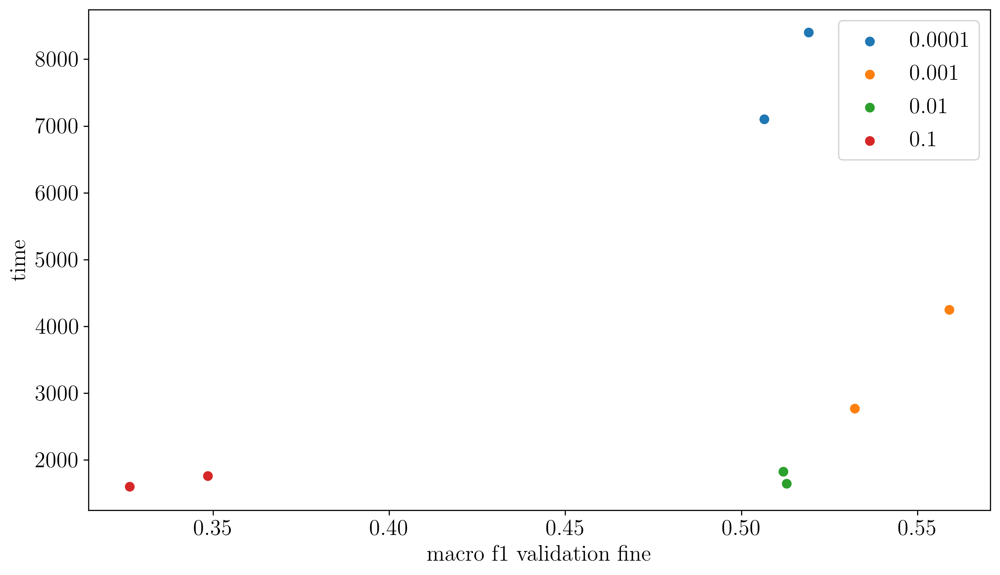

In [7]:
ts.trialScatter('macro f1 validation fine', 'time', 'learning_rate', True)